In [1]:
# подключаем каггл апи
!pip install kaggle

from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 64 bytes


In [2]:
# забираем все данные с каггла
!kaggle competitions download -c sweden-traffic-signs-classification

  0% 0.00/3.36M [00:00<?, ?B/s]
100% 3.36M/3.36M [00:00<00:00, 111MB/s]
  0% 0.00/16.7k [00:00<?, ?B/s]
100% 16.7k/16.7k [00:00<00:00, 14.9MB/s]
  0% 0.00/11.9k [00:00<?, ?B/s]
100% 11.9k/11.9k [00:00<00:00, 13.6MB/s]
  0% 0.00/81.9k [00:00<?, ?B/s]
100% 81.9k/81.9k [00:00<00:00, 27.2MB/s]


In [3]:
# подгружаем с компьютера zip архив с данными
from google.colab import files
files.upload()
# choose the file on your computer to upload it then

Saving data.zip to data.zip


{'data.zip': b'PK\x03\x04\n\x00\x00\x00\x00\x00Q\x07\xa2N\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00data/PK\x03\x04\x14\x00\x00\x00\x08\x00\xd8\xb6oMg\xa3\xd4\xd4 \x04\x00\x00\xb9\x04\x00\x00\x17\x00\x00\x00data/picture-000514.jpg\xfb\x7f\xe3\xff\x03\x06\x01/7O7\x06FF\x06\x06F d\xf8\x7f\x9b\xc1\x99\x81\x83\x8d\x8d\x9d\x8d\x95\x83\x9d\x9d\x9d\x93\x93\x83\x8bG\x84\x97\x87\x9b\x9bGRH\x98_DVJ^NVJFFAEO]AIGYFF\xc3\\S\xc7\xc0\xd0\xc4\xc4D^\xdd\xd2\xd6\xc2\xc8F\xcf\xd8\xc4\x08d\x08#\'\'\'\x0f7\x8f\x04/\xaf\x84\x91\xa2\x8c\xa2\x11\xc9\xe0\xff\x01\x06A\x0e\x06\r\x06ufF%\x06&AFfA\xc6\xffG\x18\xe4\x81\xeede\x04\x03\x06(`dbfaec\xe7\xe0\xe4\xe2\x06*\xd8*\xc0\xc0\xc4\xc8\xcc\xcc\xc4\xc2\xcc\xca\xca\xc2\x02\x94\xad\x05\xca3\xb0\x08\xb2\n)\x1a:\xb2\t\x07&\xb2+\x15\x8a\x185N\\\xc8\xa1\xec\xb4\xf1\xa0h\xd0\xc5\x0f*\xc6IEM\x9c\\b\xe2\x12\x92R\xaaj\xea\x1a\x9aZ&\xa6f\xe6\x16\x96V\xce.\xaen\xee\x1e\x9e^\xc1!\xa1a\xe1\x11\x91Q\xc9)\xa9i\xe9\x19\x99Y\xc5%\xa5e\xe5\x15\x95U\xcd-\xadm\xed\x

In [4]:
# распаковываем архим с фотографиями
!unzip data.zip

Archive:  data.zip
   creating: data/
  inflating: data/picture-000514.jpg  
  inflating: data/picture-000824.jpg  
  inflating: data/picture-001287.jpg  
  inflating: data/picture-001461.jpg  
  inflating: data/picture-001740.jpg  
  inflating: data/picture-001823.jpg  
  inflating: data/picture-001876.jpg  
  inflating: data/picture-002073.jpg  
  inflating: data/picture-002117.jpg  
  inflating: data/picture-002420.jpg  
  inflating: data/picture-002470.jpg  
  inflating: data/picture-002886.jpg  
  inflating: data/picture-003350.jpg  
  inflating: data/picture-003938.jpg  
  inflating: data/picture-004325.jpg  
  inflating: data/picture-004356.jpg  
  inflating: data/picture-004463.jpg  
  inflating: data/picture-005337.jpg  
  inflating: data/picture-005527.jpg  
  inflating: data/picture-005603.jpg  
  inflating: data/picture-005840.jpg  
  inflating: data/picture-005884.jpg  
  inflating: data/picture-006492.jpg  
  inflating: data/picture-006989.jpg  
  inflating: data/picture-

In [0]:
# Установим размер классифицируемых изображений
PIC_SIZE = 50
# Путь к предобработанным данным
data_path = '//'#'data//'
# Путь, куда сохраним модель
model_save_path = 'signs_classifier.pth'

In [6]:
import pandas as pd
import numpy as np
import torch
import os
from PIL import Image
import torchvision
import matplotlib.pyplot as plt

print('Версия torch', torch.__version__)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
if torch.cuda.is_available():
    print(torch.cuda.get_device_name(device))
else:
    print('Using CPU')
    
torch.manual_seed(0) # надеюсь этого хватит для воспроизводимости полной

Версия torch 1.1.0
Tesla T4


Ноутбук создан под версией torch '1.0.1'

### Создадим класс-обёртку для нашего датасета

In [0]:
import torchvision.transforms as transforms
from torch.utils.data import Dataset

class SignsDataset(Dataset):
    """Road signs dataset."""

    def __init__(self, csv_file, root_dir, transform=None, no_labels=False):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.
        """
        self.signs_frame = pd.read_csv(csv_file)
        print(f'{len(self.signs_frame)} samples loaded')
        
        self.root_dir = root_dir
        self.transform = transform
        self.no_labels = no_labels
        
        # В тестовом датасете нет ответов
        if not self.no_labels:
            # Cоздаём массив label->index и массив index->label
            self.labels = self.signs_frame['label'].unique()
            self.label_indexes = {}
            for i, label in enumerate(self.labels):
                self.label_indexes[label] = i

    def __len__(self):
        return len(self.signs_frame)

    def __getitem__(self, idx):
        # Загрузим изображение и приведём к размеру 50х50
        img_name = self.root_dir + self.signs_frame.iloc[idx, 0]
        image = Image.open(img_name)
        image = image.resize((PIC_SIZE, PIC_SIZE), Image.ANTIALIAS)
        
        # Применим преобразования изображения (например аугментацию)
        if self.transform:
            image = self.transform(image)
            
        # Для тестового датасета не нужны ответы
        if not self.no_labels:
            # В роли ответа будем давать номер label
            label_string = self.signs_frame.iloc[idx, 1]
            label = self.label_indexes[label_string]
        
            sample = {'image': image, 'label': label}
        else:
            sample = {'image': image}
            
        return sample

### Создадим DataLoader'ы, облегчающие закрузку и сэмплинг данных

In [8]:
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import DataLoader

# Инициализируем загрузчик датасета (класс выше)
dataset = SignsDataset('train.csv',#data_path + 'train.csv', 
                       'data//',#data_path + 'data//', 
                       torchvision.transforms.ToTensor())

indicies = np.arange(len(dataset))

np.random.seed(0)
np.random.shuffle(indicies)

# Разбиение датасета на train и validation
train_sampler = SubsetRandomSampler(indicies[:int(len(dataset)*0.5)])
validation_sampler = SubsetRandomSampler(indicies[int(len(dataset)*0.5):])

# DataLoader достаёт данные из dataset батчами
signsTrainLoader = DataLoader(dataset, batch_size=16, sampler=train_sampler)
signsValidationLoader = DataLoader(dataset, batch_size=32, sampler=validation_sampler)

2503 samples loaded


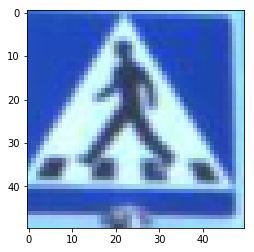

In [9]:
# Посмотрим, что выдаёт одна итерация DataLoader
batch = next(iter(signsTrainLoader))
img = batch['image'][0]
img = np.transpose(img, (1, 2, 0))

plt.imshow(img)

### Данные сильно несбалансированы (unbalanced dataset)
### Задача
    Взгляните на количество представителей каждого класса 
    К чему это может привести?
    
    Подумайте о вариантах исправления проблемы
#### upsampling, аугментация данных

In [10]:
df = dataset.signs_frame
classes_number = df['label'].nunique()
print('Classes number:', classes_number)
df.groupby('label')['file_name'].nunique()

Classes number: 17


label
100_SIGN                    62
110_SIGN                    18
30_SIGN                     30
50_SIGN                    118
60_SIGN                     19
70_SIGN                    150
80_SIGN                     61
90_SIGN                     16
GIVE_WAY                   143
NO_PARKING                  45
NO_STOPPING_NO_STANDING     51
OTHER                      322
PASS_EITHER_SIDE            19
PASS_RIGHT_SIDE            364
PEDESTRIAN_CROSSING        630
PRIORITY_ROAD              438
STOP                        17
Name: file_name, dtype: int64

## Создаём и обучаем сеть

In [0]:
import torch.nn as nn
import torch.nn.functional as F  # Functional

In [0]:
# Класс свёрточной нейронной сети
class SimpleConvNet(nn.Module):
    def __init__(self, class_number):
        # вызов конструктора предка
        super(SimpleConvNet, self).__init__()
        # необходмо заранее знать, сколько каналов у картинки (сейчас = 3),
        # которую будем подавать в сеть, больше ничего
        # про входящие картинки знать не нужно
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=6, kernel_size=5)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.conv2 = nn.Conv2d(in_channels=6, out_channels=16, kernel_size=5)
        
        self.fc1 = nn.Linear(16 * 9 * 9, 120)  # !!! 
        
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, class_number)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        
        # Подаём картинку на вход и увидим, сколько элементов на входе первого fully connected!
        # Подробнее замечание снизу (оно из прошлого семинара)
        # print(x.shape)
        ## ИЛИ ЖЕ МОЖНО ЭТО РАССЧИТАТЬ, НО ЭТО ДОЛЬШЕ
        
        x = x.view(-1, 16 * 9 * 9)  # !!! Аналог Flatten в keras
        
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        # Функция акктивации отсутствует
        # torch.nn.CrossEntropyLoss разбирается с этим сам
        return x

#### Примечание из прошлого семинара

Важное примечание: Вы можете заметить, что в строчках с #!!! есть не очень понятный сходу $9 * 9 * 16$. Это -- размерность картинки перед FC-слоями (H x W x C), тут её приходиться высчитывать вручную (в Keras, например, .Flatten() всё делает за Вас). Однако есть один лайфхак -- просто сделайте в forward() print(x.shape) (закомментированная строка). Вы увидите размер (batch_size, C, H, W) -- нужно перемножить все, кроме первого (batch_size), это и будет первая размерность Linear(), и именно в C H W нужно "развернуть" x перед подачей в Linear().

То есть нужно будет запустить цикл с обучением первый раз с print() и сделать после него break, посчитать размер, вписать его в нужные места и стереть print() и break.

In [0]:
from torchvision import datasets, models, transforms

In [14]:
# Создаём сеть
#cnn = SimpleConvNet(classes_number).to(device)
# вместо простой сетки возьмем одну из предобученных
cnn = models.vgg16(pretrained=True)#models.alexnet(pretrained=True)
cnn = cnn.to(device)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/checkpoints/vgg16-397923af.pth
100%|██████████| 553433881/553433881 [00:06<00:00, 80903798.44it/s]


In [15]:
# посмотрим на структуру сетки, чтобы увидеть сколько входов нам надо сделать на нашем слое
print(cnn)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d

In [16]:
# num_features -- это размерность вектора фич, поступающего на вход FC-слою
num_features = 25088#9216 25088
# Заменяем Fully-Connected слой на наш линейный классификатор
torch.manual_seed(0)
cnn.classifier = nn.Sequential(
            nn.Dropout(),
            nn.Linear(num_features, 200),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(200, classes_number),
            nn.LogSoftmax()
        )
cnn = cnn.to(device)
print(cnn)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d

In [17]:
# Взглянем на вывод
batch = next(iter(signsTrainLoader))
cnn(batch['image'].to(device))[0]

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:92: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


tensor([-2.7768, -2.6082, -2.6042, -2.4752, -2.5655, -2.6814, -2.8892, -2.6389,
        -3.1608, -3.1272, -3.2065, -2.9688, -2.9662, -3.0079, -3.0173, -2.9363,
        -2.9449], device='cuda:0', grad_fn=<SelectBackward>)

In [18]:
from tqdm import tqdm_notebook

# С помощью этого увидим, как сеть обучалась
history = {'loss':[], 'val_loss':[]}

# Выбираем функцию потерь
loss_fn = torch.nn.CrossEntropyLoss()

# Выбираем алгоритм оптимизации и learning_rate
learning_rate = 1e-4
optimizer = torch.optim.Adam(cnn.parameters(), lr=learning_rate)

# Цикл обучения
i = 0
for epoch in tqdm_notebook(range(500)): # попробуем подольше пообучать сетку и посмотрим, что из этого выйдет

    running_loss = 0.0
    for batch in signsTrainLoader:
        
        # Так получаем текущий батч
        X_batch, y_batch = batch['image'].to(device), batch['label'].to(device)
        
        # Обнуляем веса
        optimizer.zero_grad()

        # forward + backward + optimize
        y_pred = cnn(X_batch)
        loss = loss_fn(y_pred, y_batch)
        loss.backward()
        optimizer.step()

        # Выведем текущий loss
        running_loss += loss.item()
        
        # Пишем в лог каждые 50 батчей
        if i % 50 == 49:
            batch = next(iter(signsValidationLoader))
            X_batch, y_batch = batch['image'].to(device), batch['label'].to(device)
            y_pred = cnn(X_batch)
            
            history['loss'].append(loss.item())
            history['val_loss'].append(loss_fn(y_pred, y_batch).item())
        
        # Выведем качество каждые 1000 батчей
        if i % 1000 == 999:
            print('[%d, %5d] loss: %.4f' % (epoch + 1, i + 1, running_loss / 1000))
            running_loss = 0
        i += 1

# Сохраним модель
torch.save(cnn.state_dict(), model_save_path)
print('Обучение закончено')

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:92: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


[13,  1000] loss: 0.0003
[26,  2000] loss: 0.0070
[38,  3000] loss: 0.0000
[51,  4000] loss: 0.0000
[64,  5000] loss: 0.0000
[76,  6000] loss: 0.0000
[89,  7000] loss: 0.0000
[102,  8000] loss: 0.0000
[114,  9000] loss: 0.0000
[127, 10000] loss: 0.0000
[140, 11000] loss: 0.0000
[152, 12000] loss: 0.0000
[165, 13000] loss: 0.0000
[178, 14000] loss: 0.0000
[190, 15000] loss: 0.0000
[203, 16000] loss: 0.0000
[216, 17000] loss: 0.0000
[228, 18000] loss: 0.0000
[241, 19000] loss: 0.0000
[254, 20000] loss: 0.0022
[266, 21000] loss: 0.0013
[279, 22000] loss: 0.0001
[292, 23000] loss: 0.0004
[304, 24000] loss: 0.0000
[317, 25000] loss: 0.0000
[330, 26000] loss: 0.0000
[342, 27000] loss: 0.0000
[355, 28000] loss: 0.0000
[368, 29000] loss: 0.0000
[380, 30000] loss: 0.0463
[393, 31000] loss: 0.0000
[406, 32000] loss: 0.0000
[418, 33000] loss: 0.0000
[431, 34000] loss: 0.0000
[444, 35000] loss: 0.0000
[456, 36000] loss: 0.0000
[469, 37000] loss: 0.0000
[482, 38000] loss: 0.0000
[494, 39000] loss: 

### Начертим кривые обучения

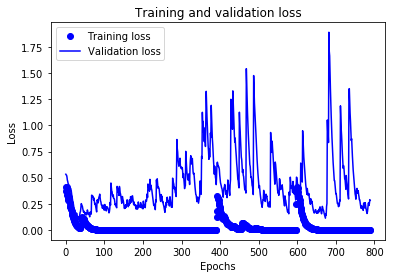

In [19]:
# Скользящее среднее
def smooth_curve(points, factor=0.9):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

plt.clf()
loss_values = smooth_curve(history['loss'])
val_loss_values = smooth_curve(history['val_loss'])
epochs = np.arange(len(loss_values))
plt.plot(epochs, loss_values, 'bo', label='Training loss')
plt.plot(epochs, val_loss_values, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show() # выглядит так себе, но результаты получаются приятные

### Выведем confusion matrix

In [0]:
import itertools
    
# Воспользуемся функцией из документации matplotlib, выводящей confusion matrix 
# Source https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html    
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    cm = cm.T
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)
    plt.figure(figsize=(16,11))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    plt.tight_layout()

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:92: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


Normalized confusion matrix


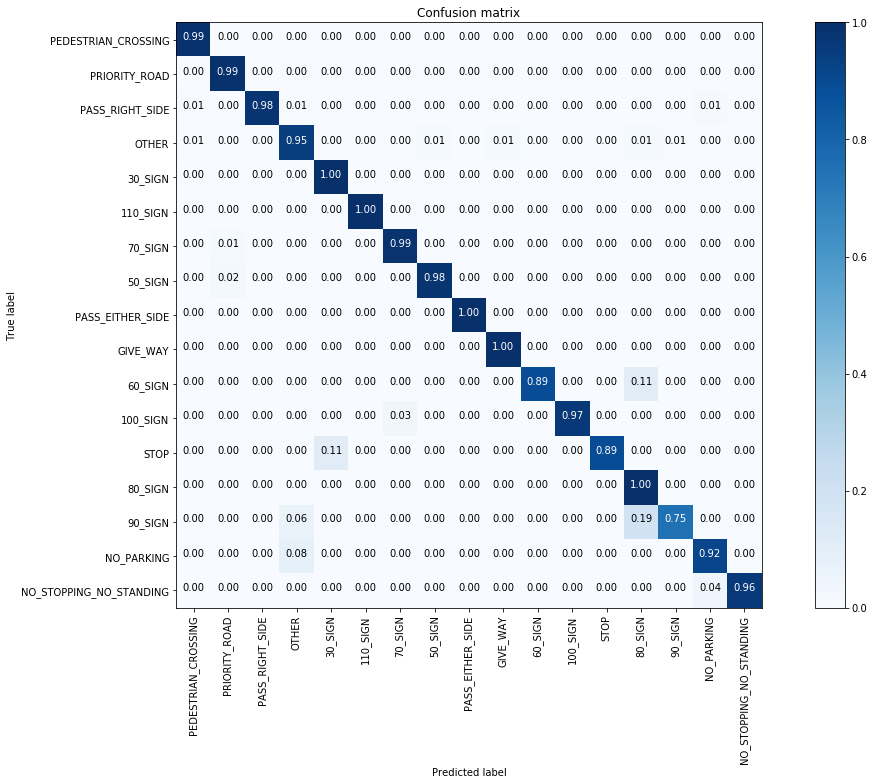

In [21]:
from sklearn.metrics import confusion_matrix

y_test_all = torch.Tensor().long()
predictions_all = torch.Tensor().long()

# Пройдём по всему validation датасету и запишем ответы сети
with torch.no_grad():
    for batch in signsValidationLoader:
        predictions = cnn(batch['image'].to(device))
        y_test = batch['label']
        _, predictions = torch.max(predictions.cpu(), 1)
        
        # Аналог append для list
        y_test_all = torch.cat((y_test_all, y_test), 0)
        predictions_all = torch.cat((predictions_all, predictions), 0)

feature_names = signsTrainLoader.dataset.labels

y_test_all = y_test_all.numpy()
predictions_all = predictions_all.numpy()

# Функция из sklearn, создаёт confusion матрицу
cm = confusion_matrix(y_test_all, predictions_all, np.arange(classes_number))
# Выведем её
plot_confusion_matrix(cm, dataset.labels, normalize=True)

### Задача
    - какие выводы можно сделать из confusion matrix?

### Выведем точность для каждого класса

In [22]:
class_correct = [0 for i in range(classes_number)]
class_total = [0 for i in range(classes_number)]

c = (predictions_all == y_test_all).squeeze()
for i in range(len(predictions_all)):
    label = predictions_all[i]            
    class_correct[label] += c[i].item()
    class_total[label] += 1

print(class_total)

for i in range(classes_number):
    print('Accuracy of %5s : %2d %%' % (
        (dataset.labels[i], (100 * class_correct[i] / class_total[i]) if class_total[i] != 0 else -1)))

[341, 206, 180, 149, 16, 8, 81, 47, 13, 70, 9, 31, 9, 27, 16, 24, 25]
Accuracy of PEDESTRIAN_CROSSING : 99 %
Accuracy of PRIORITY_ROAD : 99 %
Accuracy of PASS_RIGHT_SIDE : 97 %
Accuracy of OTHER : 94 %
Accuracy of 30_SIGN : 100 %
Accuracy of 110_SIGN : 100 %
Accuracy of 70_SIGN : 98 %
Accuracy of 50_SIGN : 97 %
Accuracy of PASS_EITHER_SIDE : 100 %
Accuracy of GIVE_WAY : 100 %
Accuracy of 60_SIGN : 88 %
Accuracy of 100_SIGN : 96 %
Accuracy of  STOP : 88 %
Accuracy of 80_SIGN : 100 %
Accuracy of 90_SIGN : 75 %
Accuracy of NO_PARKING : 91 %
Accuracy of NO_STOPPING_NO_STANDING : 96 %


### Задача
    - какая связь между confusion matrix и accuracy для каждого класса?
    
#### Числа на диагонали confusion matrix и есть эти accuracy

### Оценим качество на отдельных кадрах из validation'а

Gound-true: PEDESTRIAN_CROSSING
Prediction: PEDESTRIAN_CROSSING


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:92: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


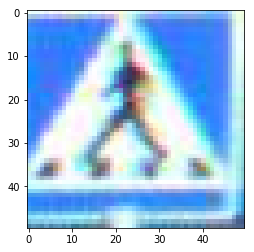

In [23]:
batch = next(iter(signsValidationLoader))
predictions = cnn(batch['image'].to(device))
y_test = batch['label']


#print(predictions, y_test)
_, predictions = torch.max(predictions, 1)

img = batch['image'][0]
img = np.transpose(img, (1, 2, 0))
plt.imshow(img)

print('Gound-true:', dataset.labels[batch['label'][0]])
print('Prediction:', dataset.labels[predictions[0]])

# Генерация файла ответов на test

In [24]:
from torch.utils.data import DataLoader

# Инициализируем загрузчик датасета (класс выше)
test_dataset = SignsDataset('test.csv',#data_path + 'test.csv', 
                       'data//',#data_path + 'data//', 
                       torchvision.transforms.ToTensor(),
                       no_labels=True)


# DataLoader достаёт данные из dataset батчами
signsTestLoader = DataLoader(test_dataset, batch_size=1)

610 samples loaded


In [25]:
answer = []

for batch in signsTestLoader:
    predictions = cnn(batch['image'].to(device))
    _, predictions = torch.max(predictions, 1)
    answer.append(dataset.labels[predictions[0]])    

prediction_df = test_dataset.signs_frame
    
prediction_df['label'] = pd.Series(answer)

namefile = 'try4' # создаем и выгружаем файлик с ответами

import os

try:
    os.stat("submits")
except:
    os.mkdir("submits")

prediction_df.to_csv('./submits/%s.csv'%(namefile), index=False)

from google.colab import files
files.download('./submits/%s.csv'%(namefile))

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:92: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)
